<div style="border-radius: 12px; padding: 20px; background: linear-gradient(135deg, #a1c4fd, #c2e9fb); color: #1a1a1a; font-size: 24px; font-weight: bold; text-align: center; box-shadow: 0 4px 6px rgba(0,0,0,0.1);">
    THỰC HÀNH 5: PHÂN LỚP ẢNH<br>
    <span style="font-size: 18px; font-weight: normal;">Bộ dữ liệu: Chest X-ray dataset</span>
</div>

<div style="border-radius: 12px; border: 2px solid #00AEEF; padding: 20px; background: linear-gradient(135deg, #e0f7fa, #f1f8e9); box-shadow: 0 4px 8px rgba(0,0,0,0.1); font-family: 'Segoe UI', sans-serif;">

<h2 style="color: #00796B; text-align: center; margin-top: 0;">
  Ứng dụng Phân tích X-Quang phát hiện Viêm Phổi
</h2>

<p style="font-size: 16px; color: #333;">
  Ứng dụng phân tích ảnh chụp X-quang để <strong>dự đoán khả năng mắc viêm phổi</strong> với nhiều mô hình để lựa chọn 
</p>

<p style="text-align: center; margin-top: 24px;">
  <a href="https://x-quang-detect-pneumonia.streamlit.app/" target="_blank" style="display: inline-block; background-color: #00AEEF; color: white; padding: 12px 24px; text-decoration: none; border-radius: 8px; font-weight: bold; box-shadow: 0 2px 6px rgba(0,0,0,0.2); transition: all 0.3s;">
    Trải nghiệm ngay tại đây
  </a>
</p>

</div>


<div style="border: 1.5px solid #ccc; border-radius: 12px; padding: 12px; max-width: 960px; margin: 0 auto; text-align: center;">

  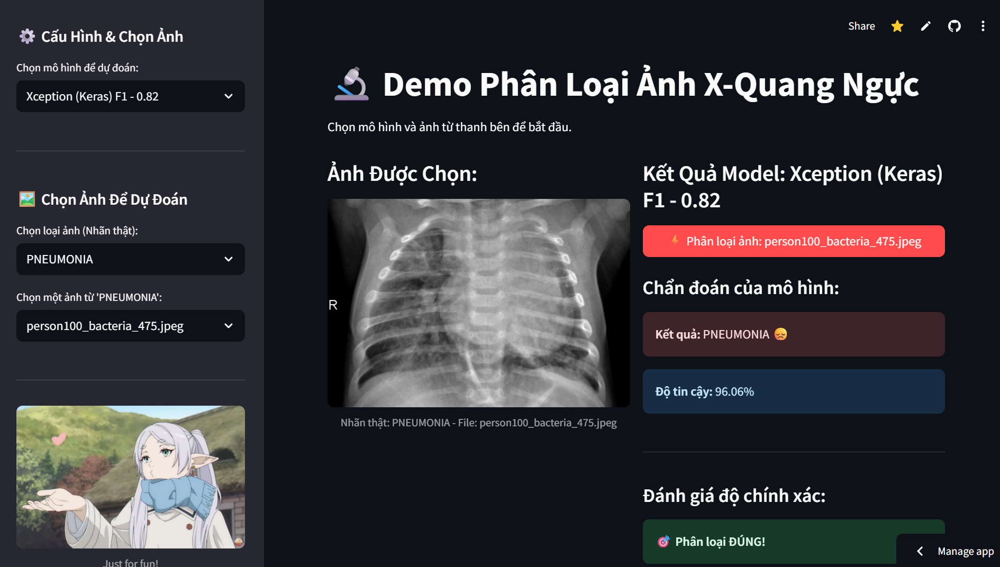

</div>


In [1]:
import glob
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import seaborn as sns

from skimage.feature import hog
from skimage.color import rgb2gray

from skimage.feature import local_binary_pattern

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [2]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as resnet_pre
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as vgg_pre
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input as densenet_pre
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.preprocessing import StandardScaler

2025-06-01 05:03:40.246959: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748754220.464254      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748754220.534176      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
  Load dữ liệu và chia train / dev / test
</h2>

In [4]:
IMG_SIZE = 227

def load_dataset(split='train'):
    X = []
    y = []
    base_path = f"/kaggle/input/chest-xray-pneumonia/chest_xray/{split}/"
    classes = ['NORMAL', 'PNEUMONIA']
    
    for idx, c in enumerate(classes):
        files = glob.glob(os.path.join(base_path, c, "*.jpeg"))
        for f in files:
            img = cv2.imread(f)
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            X.append(img)
            y.append(idx)  # 0 for NORMAL, 1 for PNEUMONIA

    X = np.array(X)
    y = np.array(y)
    
    assert X.size > 0, 'Không đọc được file ảnh!'
    return X, y

In [5]:
X_train, y_train = load_dataset(split='train')
X_val, y_val = load_dataset(split='val')
X_test, y_test = load_dataset(split='test')

<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
  Bài 1 - Làm rõ thông tin bộ dữ liệu 
</h2>

<div style="font-size: 16px; font-weight: 600; padding: 6px 10px; margin-top: 18px; border-left: 4px solid #a1c4fd; background: linear-gradient(to right, #f0f9ff, #ffffff); border-radius: 4px; color: #333;">
  a) Mục tiêu / tác vụ mà bộ dữ liệu hướng tới là gì?
</div>

Bộ dữ liệu từ bài báo **"Identifying medical diagnoses and treatable diseases by image-based deep learning"** (Kermany et al., *Cell*, 2018) được xây dựng với mục tiêu chính là:

> **Tự động chẩn đoán các bệnh lý từ hình ảnh y khoa, cụ thể là từ ảnh X-quang ngực và ảnh OCT (Optical Coherence Tomography) mắt, bằng các mô hình deep learning.**

* Tác vụ chính là **phân loại hình ảnh X-quang phổi** thành các loại bệnh khác nhau.
* Trong phần công bố đó, **tập dữ liệu chủ yếu dùng để nhận diện bệnh viêm phổi (Pneumonia)** từ ảnh X-quang phổi của trẻ em từ 1 đến 5 tuổi tại Trung tâm Y tế Phụ nữ & Trẻ em Quảng Châu (Guangzhou).
* Tất cả ảnh đều đã được:

  * Lọc bỏ ảnh kém chất lượng hoặc mờ, khó đọc.

  * Gán nhãn bởi 2 chuyên gia (và tập đánh giá được kiểm tra thêm bởi chuyên gia thứ 3).

> Mục tiêu là huấn luyện mô hình học sâu (deep learning models) để **phân biệt giữa phổi bình thường (Normal)** và **phổi bị viêm (Pneumonia)** trên ảnh X-ray – giúp hỗ trợ chẩn đoán nhanh và chính xác hơn trong lâm sàng.

<div style="font-size: 16px; font-weight: 600; padding: 6px 10px; margin-top: 18px; border-left: 4px solid #a1c4fd; background: linear-gradient(to right, #f0f9ff, #ffffff); border-radius: 4px; color: #333;">
b) Kích thước của dữ liệu là bao nhiêu trên các tập train, dev và test?
</div>
Tập train, valatidation, test có lần lượt 5216, 16, 624 bức ảnh. Trong đó tập val chủ yếu là dùng để theo dõi và điều chỉnh mô hình trong lúc huấn luyện.

In [6]:
X_train.shape, X_val.shape, X_test.shape

((5216, 227, 227, 3), (16, 227, 227, 3), (624, 227, 227, 3))

<div style="font-size: 16px; font-weight: 600; padding: 6px 10px; margin-top: 18px; border-left: 4px solid #a1c4fd; background: linear-gradient(to right, #f0f9ff, #ffffff); border-radius: 4px; color: #333;">
c) Phân bố nhãn theo từng tác vụ trên các tập train, dev và test
</div>


📊 Label distribution in Train set:
 - 0: 1341 samples (25.71%)
 - 1: 3875 samples (74.29%)


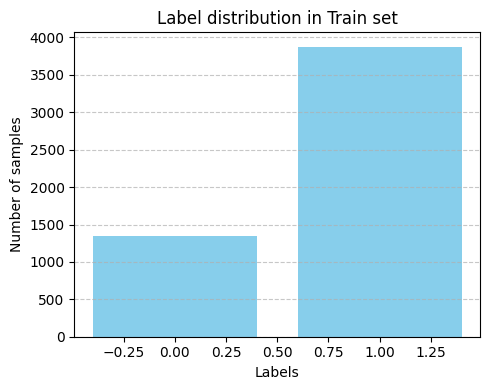


📊 Label distribution in Validation set:
 - 0: 8 samples (50.00%)
 - 1: 8 samples (50.00%)


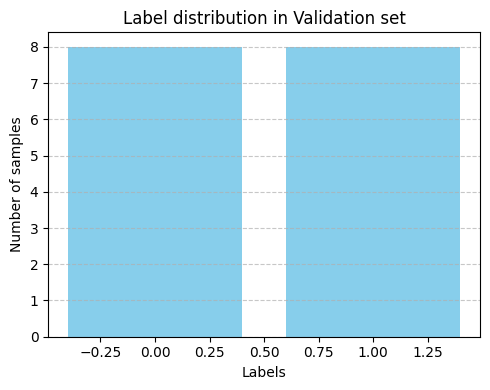


📊 Label distribution in Test set:
 - 0: 234 samples (37.50%)
 - 1: 390 samples (62.50%)


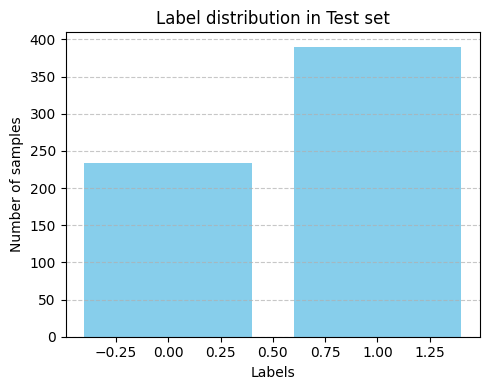

In [7]:
from collections import Counter
import matplotlib.pyplot as plt

def show_label_distribution(y_data, split_name):
    counter = Counter(y_data)
    total = sum(counter.values())

    print(f"\n📊 Label distribution in {split_name} set:")
    for label, count in counter.items():
        percent = count / total * 100
        print(f" - {label}: {count} samples ({percent:.2f}%)")

    # Vẽ biểu đồ
    plt.figure(figsize=(5, 4))
    plt.bar(counter.keys(), counter.values(), color='skyblue')
    plt.title(f"Label distribution in {split_name} set")
    plt.ylabel("Number of samples")
    plt.xlabel("Labels")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Load datasets
X_train, y_train = load_dataset(split='train')
X_val, y_val     = load_dataset(split='val')
X_test, y_test   = load_dataset(split='test')

# Hiển thị phân bố nhãn
show_label_distribution(y_train, "Train")
show_label_distribution(y_val, "Validation")
show_label_distribution(y_test, "Test")

In [8]:
print(np.unique(y_train))
print(X_train[0].shape)

[0 1]
(227, 227, 3)


<div style="font-size: 16px; font-weight: 600; padding: 6px 10px; margin-top: 18px; border-left: 4px solid #a1c4fd; background: linear-gradient(to right, #f0f9ff, #ffffff); border-radius: 4px; color: #333;">
d) Hãy hiển thị hình về ảnh X-Quang phổi lên màn hình
</div>

In [9]:
def plot_random_images(X, y, n=6):
    '''
    Hàm hiển thị ngẫu nhiên n hình về ảnh X-Quang phổi
    '''
    assert n % 2 == 0, "n phải chia hết cho 2 nha!"

    # Chuyển nhãn nếu chưa phải số (ví dụ 'NORMAL' -> 0, 'PNEUMONIA' -> 1)
    le = LabelEncoder()
    y_enc = le.fit_transform(y)

    n_per_class = n // 2

    idx_0 = np.where(y_enc == 0)[0]
    idx_1 = np.where(y_enc == 1)[0]

    # Lấy ngẫu nhiên n_per_class ảnh từ mỗi nhãn
    selected_0 = np.random.choice(idx_0, n_per_class, replace=False)
    selected_1 = np.random.choice(idx_1, n_per_class, replace=False)

    selected_idx = np.concatenate([selected_0, selected_1])
    np.random.shuffle(selected_idx)  # Trộn để ảnh hiện lên lung tung 

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(selected_idx):
        plt.subplot(1, n, i+1)
        plt.imshow(X[idx])
        plt.title(f"Label: {le.inverse_transform([y_enc[idx]])[0]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

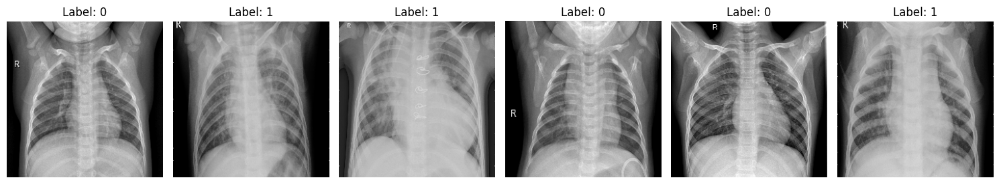

In [10]:
plot_random_images(X_train, y_train, n=6)

In [11]:
def plot_predictions_on_images(model, X_test_raw, y_test, class_labels, preprocess_fn=None, num_images=20, num_cols=5):
    """
    Hiển thị ảnh cùng với nhãn thật và nhãn dự đoán từ model sklearn-style.

    Args:
        model: mô hình đã huấn luyện (SVM, LogisticRegression,...).
        X_test_raw: list/array các ảnh gốc dạng RGB (H, W, 3).
        y_test: list/array nhãn thật (chưa encode).
        class_labels: list tên lớp, ví dụ ['Normal', 'Pneumonia'].
        preprocess_fn: hàm xử lý đặc trưng (ví dụ extract_hog), nếu cần.
        num_images: số lượng ảnh muốn hiển thị.
        num_cols: số ảnh mỗi dòng.
    """
    # Chọn ngẫu nhiên num_images ảnh
    indices = np.random.choice(len(X_test_raw), size=num_images, replace=False)
    X_vis = [X_test_raw[i] for i in indices]
    y_true = [y_test[i] for i in indices]

    # Tiền xử lý nếu cần
    if preprocess_fn:
        X_processed = preprocess_fn(X_vis)
    else:
        X_processed = np.array(X_vis)  # nếu đã là đặc trưng thì dùng luôn

    # Dự đoán
    y_pred = model.predict(X_processed)

    plt.figure(figsize=(num_cols * 3, int(np.ceil(num_images / num_cols)) * 3))
    for i, img in enumerate(X_vis):
        plt.subplot(int(np.ceil(num_images / num_cols)), num_cols, i + 1)
        plt.imshow(img.astype("uint8"))
        true_label = class_labels[y_true[i]] if isinstance(y_true[i], int) else y_true[i]
        pred_label = class_labels[y_pred[i]] if isinstance(y_pred[i], int) else y_pred[i]
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=9)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  KHÔNG dùng các phương pháp trích xuất đặc trưng, ép hình ảnh về vector 1 chiều
</h1>

Vì kích thước của ảnh hiện tại rất lớn nếu ép về 1 chiều (227x227x3) sẽ cho ra 154587 features, trong đó có rất features không có giá trị. Nên ta sẽ flatten ảnh nhưng giảm kích thước ảnh trước bằng cv2.resize để làm nhẹ, sau đó đưa vào các mô hình cổ điển. Mặc dù điều này có thể làm mất một số đặc tính của hình ảnh, nhưng sẽ tối ưu hơn về RAM và tốc độ huấn luyện mô hình.

In [12]:
def flatten_images(X, target_size=(64, 64)):
    return np.array([cv2.resize(img, target_size).flatten() for img in X])

# Flatten
X_train_flat = flatten_images(X_train)
X_val_flat = flatten_images(X_val)
X_test_flat = flatten_images(X_test)

# Encode label
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# Chuẩn hóa
scaler = StandardScaler()
X_train_flat = scaler.fit_transform(X_train_flat)
X_val_flat = scaler.transform(X_val_flat)
X_test_flat = scaler.transform(X_test_flat)

# Preprocess dùng cho plot
def preprocess_flatten_and_scale(X):
    return scaler.transform(flatten_images(X))

In [13]:
# Logistic Regression
log_model = LogisticRegression(max_iter=1000)
log_model.fit(X_train_flat, y_train_enc)

print("🔹 Logistic Regression (Flattened) trên tập TEST")
y_pred_log_test = log_model.predict(X_test_flat)
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_log_test))
print(classification_report(y_test_enc, y_pred_log_test, target_names=[str(c) for c in le.classes_]))

# SVM
svm_model = SVC()
svm_model.fit(X_train_flat, y_train_enc)

print("🔹 SVM (Flattened) trên tập TEST")
y_pred_svm_test = svm_model.predict(X_test_flat)
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_svm_test))
print(classification_report(y_test_enc, y_pred_svm_test, target_names=[str(c) for c in le.classes_]))

# Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_flat, y_train_enc)

print("🔹 Random Forest (Flattened) trên tập TEST")
y_pred_rf_test = rf_model.predict(X_test_flat)
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_rf_test))
print(classification_report(y_test_enc, y_pred_rf_test, target_names=[str(c) for c in le.classes_]))

🔹 Logistic Regression (Flattened) trên tập TEST
Accuracy TEST: 0.7483974358974359
              precision    recall  f1-score   support

           0       0.95      0.35      0.51       234
           1       0.72      0.99      0.83       390

    accuracy                           0.75       624
   macro avg       0.83      0.67      0.67       624
weighted avg       0.80      0.75      0.71       624

🔹 SVM (Flattened) trên tập TEST
Accuracy TEST: 0.7772435897435898
              precision    recall  f1-score   support

           0       0.95      0.43      0.59       234
           1       0.74      0.99      0.85       390

    accuracy                           0.78       624
   macro avg       0.85      0.71      0.72       624
weighted avg       0.82      0.78      0.75       624

🔹 Random Forest (Flattened) trên tập TEST
Accuracy TEST: 0.7676282051282052
              precision    recall  f1-score   support

           0       0.97      0.39      0.56       234
           1 

| Mô hình             | Macro F1 | Recall lớp 0 | Recall lớp 1 |
| ------------------- | -------- | ------------ | ------------ |
| Logistic Regression | 0.67     | 0.35         | 0.99         |
| SVM                 | 0.72     | 0.43         | 0.99         |
| Random Forest       | 0.70     | 0.39         | 0.99         |

> **Ghi chú**: Ảnh đầu vào chỉ được **resize và flatten**, **không trích xuất đặc trưng**, dẫn đến độ thiên lệch cao, đặc biệt là với lớp 0.

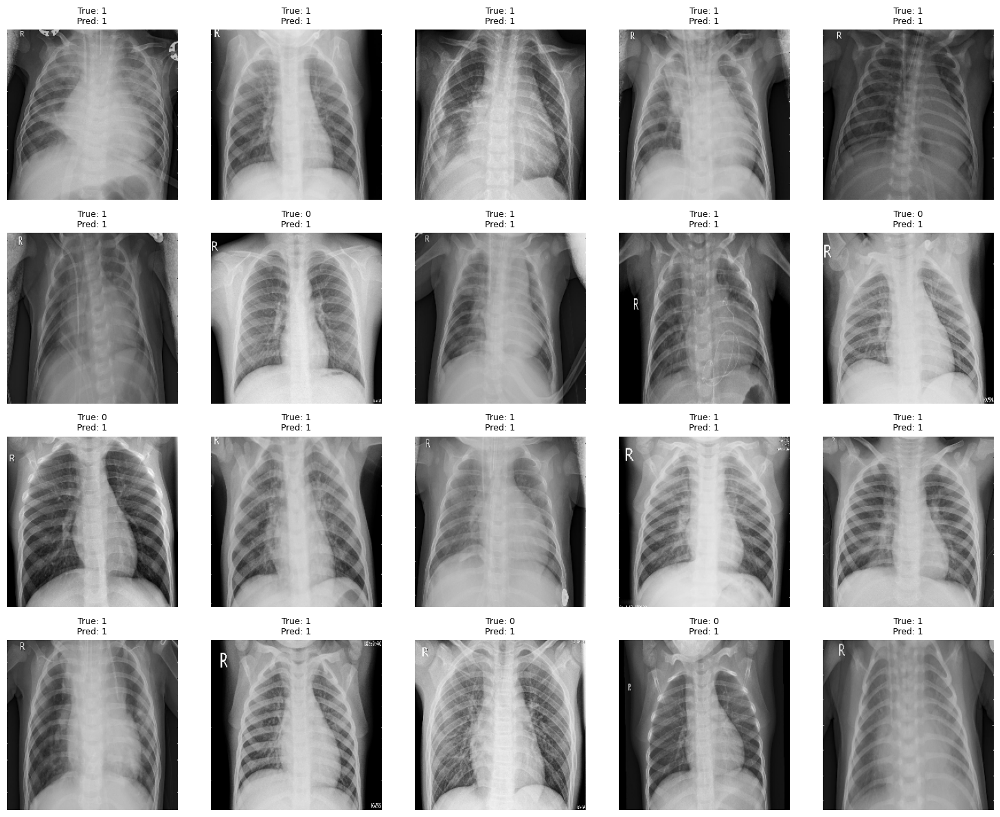

In [14]:
plot_predictions_on_images(
    model=log_model, 
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_flatten_and_scale, 
    num_images=20
)

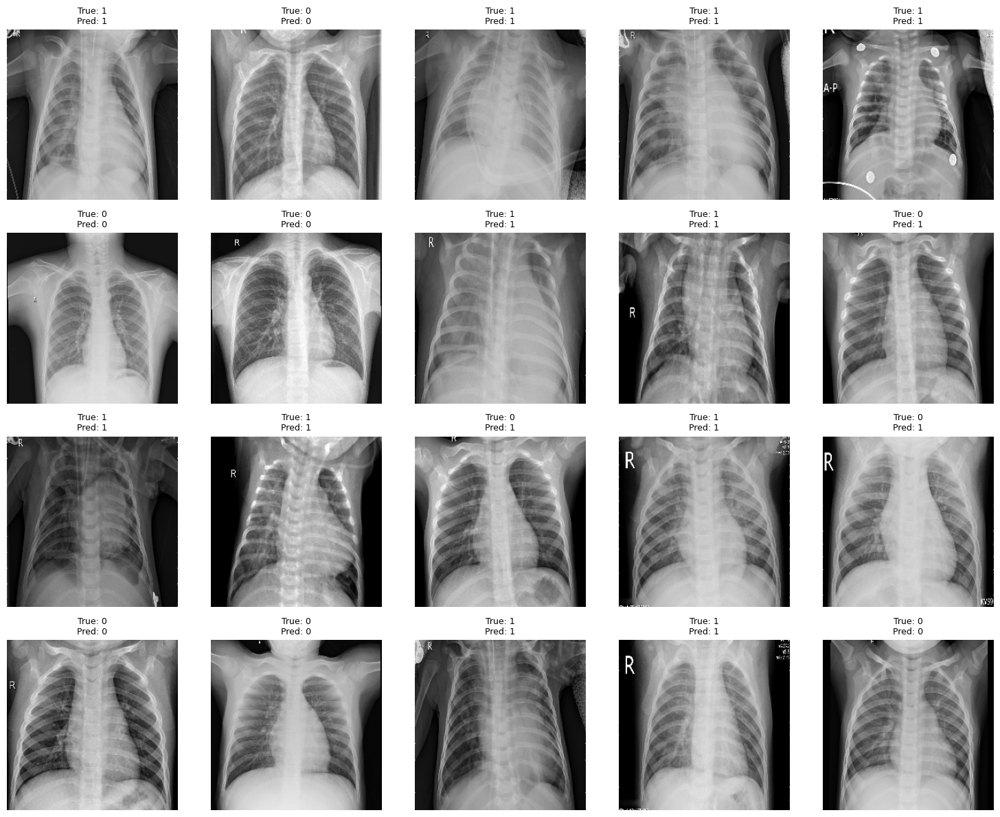

In [15]:
plot_predictions_on_images(
    model=svm_model,
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_flatten_and_scale,  
    num_images=20
)

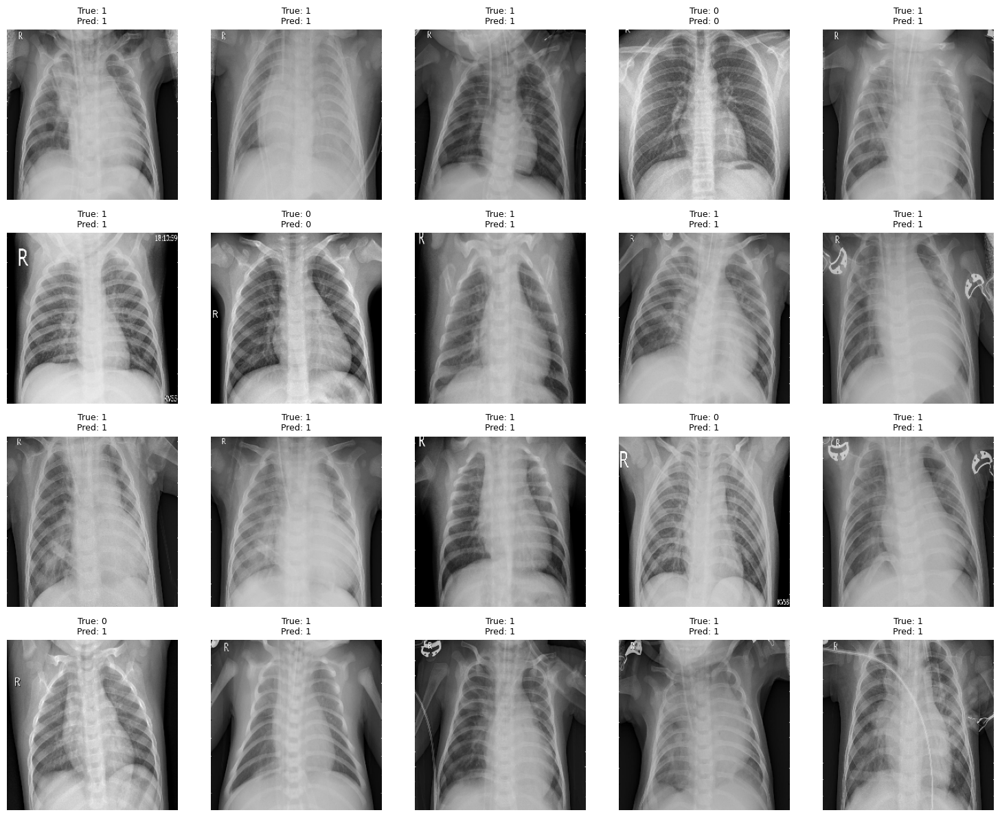

In [16]:
plot_predictions_on_images(
    model=rf_model, 
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_flatten_and_scale,  
    num_images=20
)

Tuy nhiên, cả ba mô hình đều nghiêng mạnh về lớp 1 (recall lớp 1 = 0.99), cho thấy sự mất cân bằng trong việc nhận diện lớp 0.

<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  Sử dụng HOG để trích xuất đặc trưng hình ảnh
</h1>


HOG là phương pháp trích xuất đặc trưng giúp mô hình ML truyền thống hiểu được ảnh bằng cách biến ảnh thành vector số giàu thông tin. Nó hoạt động bằng cách chia ảnh thành các ô nhỏ (cells), tính gradient (biên độ và hướng thay đổi độ sáng), sau đó tạo histogram hướng tại từng ô. Các histogram này được nối lại tạo thành 1 vector đặc trưng – chính là đầu vào để huấn luyện mô hình.


In [17]:
def extract_hog_features(X):
    '''
    Hàm trích xuất đặc trưng bằng HOG (Histogram of Oriented Gradients)
    '''
    hog_features = []
    for img in X:
        gray = rgb2gray(img)  # chuyển ảnh về grayscale
        feat = hog(
            gray,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys'
        )
        hog_features.append(feat)
    return np.array(hog_features)

In [18]:
# Trích xuất đặc trưng HOG
X_train_hog = extract_hog_features(X_train)
X_val_hog = extract_hog_features(X_val)
X_test_hog = extract_hog_features(X_test)

# Encode nhãn
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# Chuẩn hóa đặc trưng
scaler_hog = StandardScaler()
X_train_hog = scaler_hog.fit_transform(X_train_hog)
X_val_hog = scaler_hog.transform(X_val_hog)
X_test_hog = scaler_hog.transform(X_test_hog)

# Hàm tiền xử lý HOG dùng cho plot
def preprocess_hog_and_scale(X):
    X_hog = extract_hog_features(X)
    X_scaled = scaler_hog.transform(X_hog)
    return X_scaled

<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
  Bài 2 + 3 + 4 - Huấn luyện mô hình bằng phương pháp Logistic Regression, SVM và so sánh
</h2>

In [19]:
# Logistic Regression (HOG)
log_model_hog = LogisticRegression(max_iter=1000)
log_model_hog.fit(X_train_hog, y_train_enc)

print("🔹 Logistic Regression (HOG) trên tập TEST")
y_pred_log_test_hog = log_model_hog.predict(X_test_hog)
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_log_test_hog))
print(classification_report(y_test_enc, y_pred_log_test_hog, target_names=[str(c) for c in le.classes_]))

# Support Vector Machine (HOG)
svm_model_hog = SVC()
svm_model_hog.fit(X_train_hog, y_train_enc)

# Dự đoán trên tập test (đồng bộ feature: HOG)
y_pred_svm_test_hog = svm_model_hog.predict(X_test_hog)
print("🔹 SVM (HOG) trên tập TEST")
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_svm_test_hog))
print(classification_report(y_test_enc, y_pred_svm_test_hog, target_names=[str(c) for c in le.classes_]))

🔹 Logistic Regression (HOG) trên tập TEST
Accuracy TEST: 0.7355769230769231
              precision    recall  f1-score   support

           0       0.96      0.31      0.47       234
           1       0.70      0.99      0.82       390

    accuracy                           0.74       624
   macro avg       0.83      0.65      0.65       624
weighted avg       0.80      0.74      0.69       624

🔹 SVM (HOG) trên tập TEST
Accuracy TEST: 0.7227564102564102
              precision    recall  f1-score   support

           0       0.96      0.27      0.43       234
           1       0.69      0.99      0.82       390

    accuracy                           0.72       624
   macro avg       0.83      0.63      0.62       624
weighted avg       0.79      0.72      0.67       624



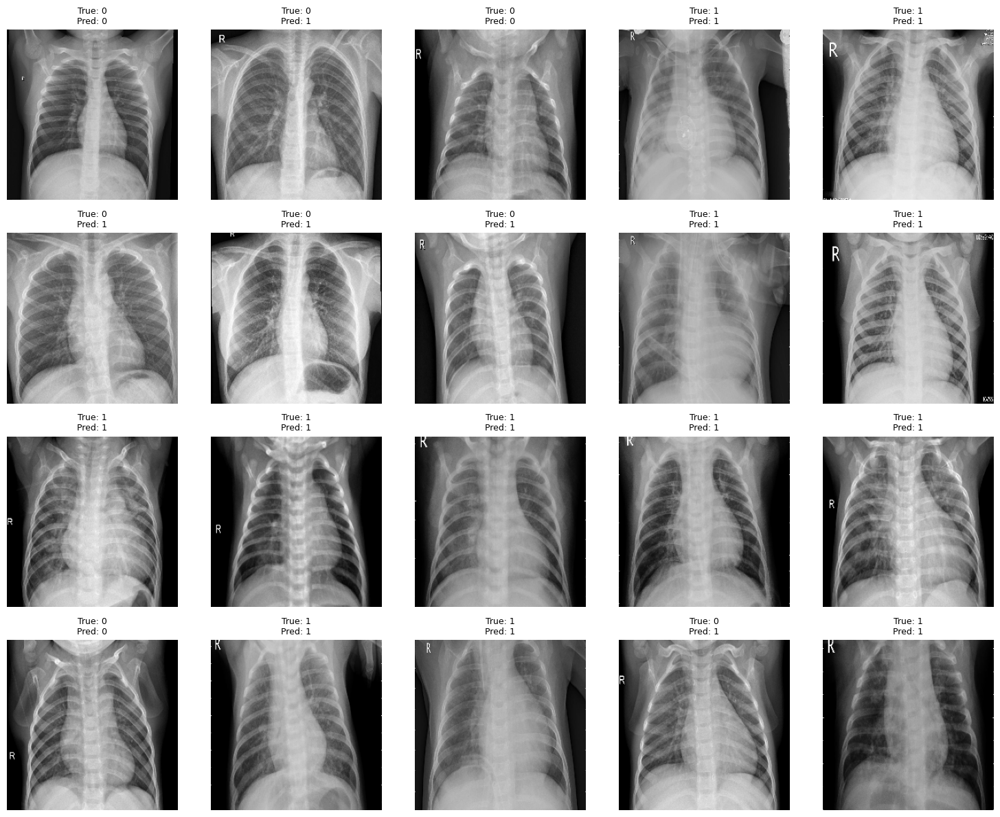

In [20]:
plot_predictions_on_images(
    model=log_model_hog, 
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_hog_and_scale,
    num_images=20,
    num_cols=5
)


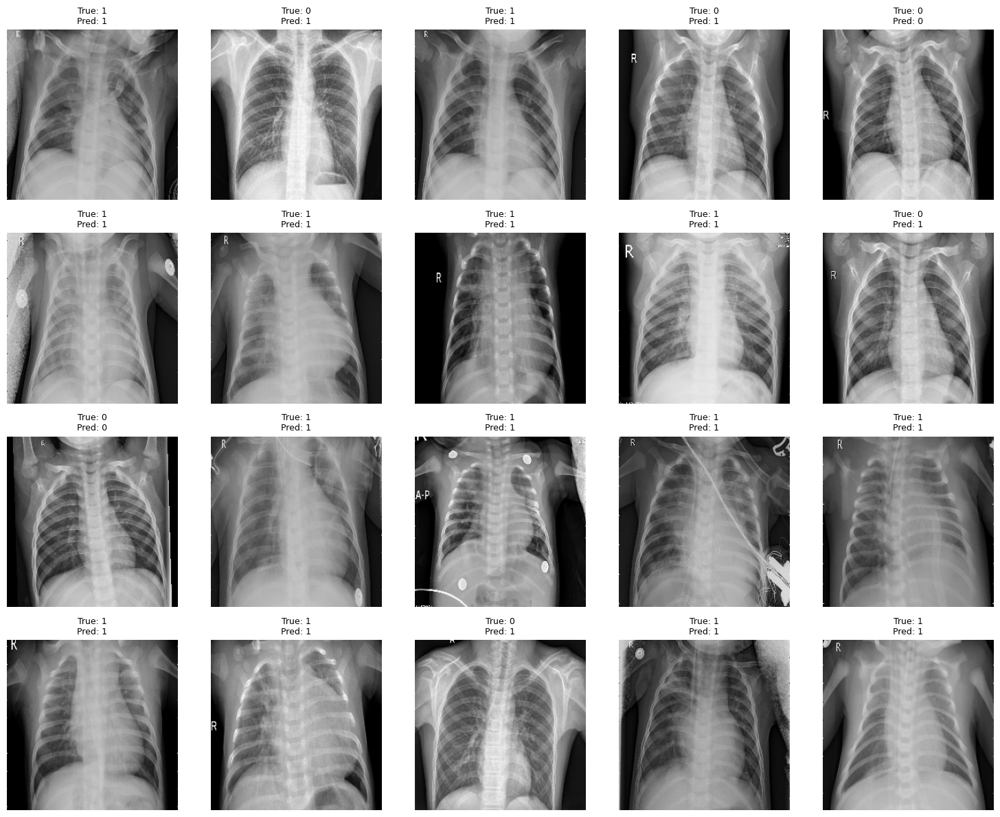

In [21]:
plot_predictions_on_images(
    model=svm_model_hog,  
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_hog_and_scale,
    num_images=20,
    num_cols=5
)

| Mô hình                   | Macro F1 | Recall lớp 0 | Recall lớp 1 |
| ------------------------- | -------- | ------------ | ------------ |
| Logistic Regression (HOG) | 0.65     | 0.31         | 0.99         |
| SVM (HOG)                 | 0.62     | 0.27         | 0.99         |

> 📌 **Ghi chú**: Dù đã áp dụng **trích xuất đặc trưng HOG**, nhưng hiệu suất của các mô hình vẫn **không được cải thiện đáng kể** so với việc chỉ flatten ảnh. Đặc biệt, **recall lớp 0 vẫn rất thấp**, cho thấy HOG có thể **chưa đủ mạnh để phân tách đặc trưng** giữa hai lớp trong bài toán này.

<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  Sử dụng LBP để trích xuất đặc trưng hình ảnh
</h1>

LBP (Local Binary Pattern) là phương pháp trích xuất đặc trưng dựa trên kết cấu ảnh. Với mỗi pixel, LBP so sánh nó với các pixel lân cận rồi mã hóa thành chuỗi nhị phân, tạo ra một “vân tay kết cấu” đặc trưng. Các giá trị này được gom lại thành histogram, dùng làm vector đặc trưng để huấn luyện mô hình truyền thống.

In [22]:
def extract_lbp_features(X, P=8, R=1, method='uniform'):
    '''
    Hàm trích xuất đặc trưng bằng phương pháp Local Binary Pattern (LBP)
    
    Tham số:
        - P: Số điểm lấy mẫu lân cận (default: 8)
        - R: Bán kính (default: 1)
        - method: 'default', 'ror', 'uniform', 'var' (default: 'uniform')
    
    Trả về:
        - Mảng đặc trưng LBP (histogram của các mã hóa)
    '''
    lbp_features = []
    for img in X:
        gray = rgb2gray(img)
        lbp = local_binary_pattern(gray, P, R, method)
        
        # Tính histogram (tần suất xuất hiện của từng mã LBP)
        n_bins = int(lbp.max() + 1)
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
        
        lbp_features.append(hist)
    
    return np.array(lbp_features)

In [23]:
# Trích xuất đặc trưng LBP
X_train_lbp = extract_lbp_features(X_train)
X_val_lbp = extract_lbp_features(X_val)
X_test_lbp = extract_lbp_features(X_test)

# Encode nhãn (nếu chưa làm)
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# Chuẩn hóa đặc trưng
scaler_lbp = StandardScaler()
X_train_lbp = scaler_lbp.fit_transform(X_train_lbp)
X_val_lbp = scaler_lbp.transform(X_val_lbp)
X_test_lbp = scaler_lbp.transform(X_test_lbp)

# Hàm tiền xử lý LBP dùng cho plot
def preprocess_lbp_and_scale(X):
    X_lbp = extract_lbp_features(X)
    X_scaled = scaler_lbp.transform(X_lbp)
    return X_scaled

/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
  Bài 2 + 3 + 4 - Huấn luyện mô hình bằng phương pháp Logistic Regression, SVM và so sánh
</h2>

In [24]:
# ----------------------------- Logistic Regression (LBP) -----------------------------
log_model_lbp = LogisticRegression()
log_model_lbp.fit(X_train_lbp, y_train_enc)

# TEST
y_pred_log_test_lbp = log_model_lbp.predict(X_test_lbp)
print("🔹 Logistic Regression (LBP) trên tập TEST")
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_log_test_lbp))
print(classification_report(y_test_enc, y_pred_log_test_lbp, target_names=[str(c) for c in le.classes_]))

# ----------------------------- Support Vector Machine (LBP) -----------------------------
svm_model_lbp = SVC(kernel='rbf')
svm_model_lbp.fit(X_train_lbp, y_train_enc)

# TEST
y_pred_svm_test_lbp = svm_model_lbp.predict(X_test_lbp)
print("🔹 SVM (LBP) trên tập TEST")
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_svm_test_lbp))
print(classification_report(y_test_enc, y_pred_svm_test_lbp, target_names=[str(c) for c in le.classes_]))

🔹 Logistic Regression (LBP) trên tập TEST
Accuracy TEST: 0.7596153846153846
              precision    recall  f1-score   support

           0       0.82      0.46      0.59       234
           1       0.74      0.94      0.83       390

    accuracy                           0.76       624
   macro avg       0.78      0.70      0.71       624
weighted avg       0.77      0.76      0.74       624

🔹 SVM (LBP) trên tập TEST
Accuracy TEST: 0.7852564102564102
              precision    recall  f1-score   support

           0       0.88      0.50      0.63       234
           1       0.76      0.96      0.85       390

    accuracy                           0.79       624
   macro avg       0.82      0.73      0.74       624
weighted avg       0.80      0.79      0.77       624



/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


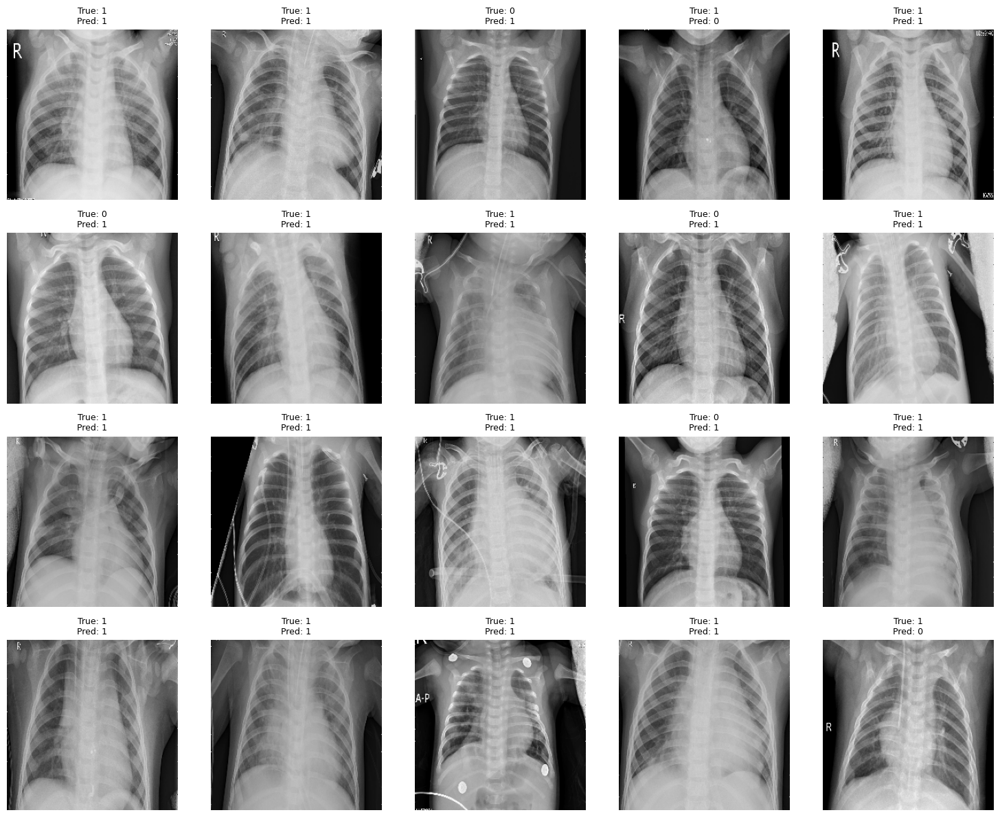

In [25]:
plot_predictions_on_images(
    model=log_model_lbp,  
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_lbp_and_scale,
    num_images=20,
    num_cols=5
)

/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


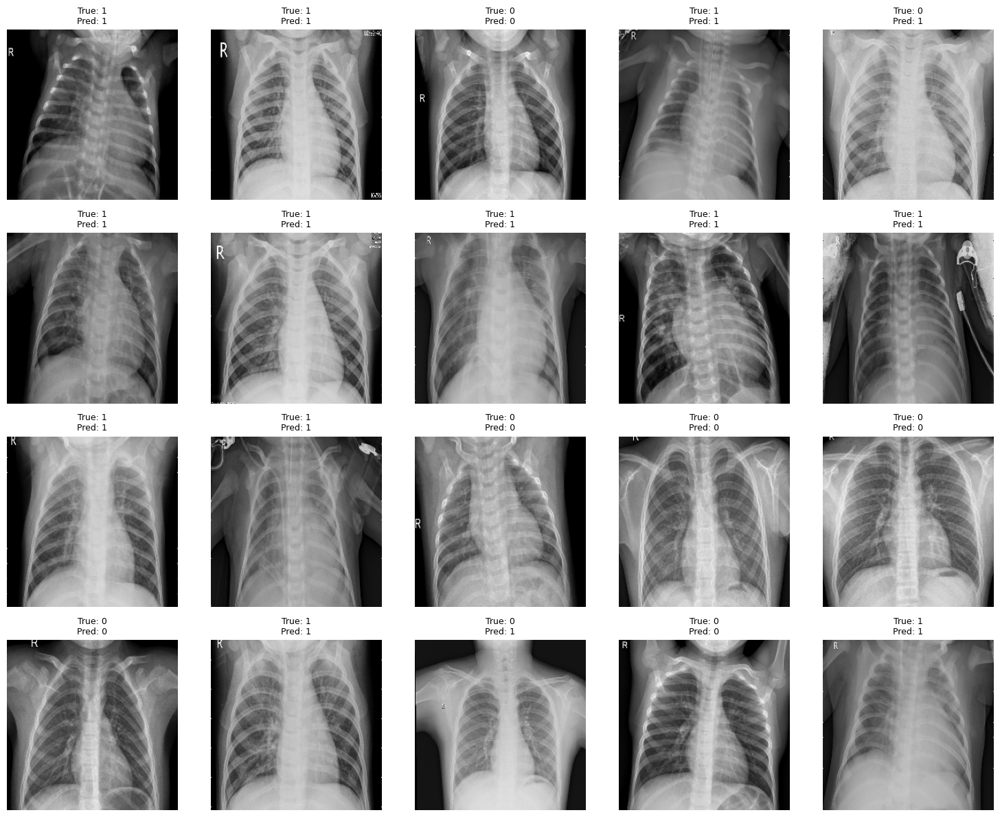

In [26]:
plot_predictions_on_images(
    model=svm_model_lbp,  
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_lbp_and_scale,
    num_images=20,
    num_cols=5
)

| Mô hình                   | Macro F1 | Recall lớp 0 | Recall lớp 1 |
| ------------------------- | -------- | ------------ | ------------ |
| Logistic Regression (LBP) | 0.71     | 0.46         | 0.94         |
| SVM (LBP, kernel = 'rbf') | 0.74     | 0.50         | 0.96         |

> 📌 **Ghi chú**: Khi sử dụng **Local Binary Pattern (LBP)** để trích xuất đặc trưng, các mô hình đã thể hiện **hiệu suất cải thiện rõ rệt** so với HOG và flatten. Đặc biệt, **recall lớp 0 tăng mạnh**, cho thấy LBP có khả năng **nắm bắt cấu trúc cục bộ ảnh hiệu quả hơn** trong bối cảnh bài toán này.


<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  kết hợp HOG + LBP (Feature Fusion)
</h1>

Kết hợp HOG + LBP giúp khai thác cả thông tin về biên (HOG) và kết cấu (LBP) trong ảnh. HOG nắm bắt hướng gradient, còn LBP ghi lại mẫu kết cấu cục bộ. Hai vector đặc trưng này được nối lại thành một vector chung, giàu thông tin hơn, giúp mô hình phân loại chính xác và mạnh mẽ hơn.


<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
    Bài 2 + 3 + 4 - Huấn luyện mô hình bằng phương pháp Logistic Regression, SVM và so sánh
</h2>

In [27]:
# 1. Ghép đặc trưng HOG + LBP
X_train_fused = np.concatenate([X_train_hog, X_train_lbp], axis=1)
X_val_fused   = np.concatenate([X_val_hog, X_val_lbp], axis=1)
X_test_fused  = np.concatenate([X_test_hog, X_test_lbp], axis=1)

# 2. Chuẩn hóa fused features
scaler_fused = StandardScaler()
X_train_fused = scaler_fused.fit_transform(X_train_fused)
X_val_fused   = scaler_fused.transform(X_val_fused)
X_test_fused  = scaler_fused.transform(X_test_fused)

# 3. Hàm tiền xử lý HOG+LBP dùng cho plot_predictions_on_images
def preprocess_fused_and_scale(X):
    """
    - X: list/array ảnh RGB gốc
    - Bước 1: Trích xuất HOG → array shape = (n_samples, dim_hog)
    - Bước 2: Trích xuất LBP → array shape = (n_samples, dim_lbp)
    - Bước 3: Ghép hai vector, rồi chuẩn hóa bằng scaler_fused
    """
    # a) Trích xuất HOG
    hog_feats = extract_hog_features(X)       # shape (n, dim_hog)
    # b) Trích xuất LBP
    lbp_feats = extract_lbp_features(X)       # shape (n, dim_lbp)

    # c) Ghép
    fused = np.concatenate([hog_feats, lbp_feats], axis=1)  # (n, dim_hog+dim_lbp)

    # d) Chuẩn hóa
    fused_scaled = scaler_fused.transform(fused)
    return fused_scaled

In [28]:
# --------------------- Logistic Regression (Fusion) ---------------------
clf_lr_fused = LogisticRegression(max_iter=1000)
clf_lr_fused.fit(X_train_fused, y_train_enc)

# TEST
y_pred_lr_test_fused = clf_lr_fused.predict(X_test_fused)
print("Logistic Regression (Fusion) trên tập TEST")
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_lr_test_fused))
print(classification_report(y_test_enc, y_pred_lr_test_fused, target_names=[str(c) for c in le.classes_]))

# --------------------- SVM (Fusion) ---------------------
clf_svm_fused = SVC(kernel='linear')  # hoặc 'rbf'
clf_svm_fused.fit(X_train_fused, y_train_enc)

# TEST
y_pred_svm_test_fused = clf_svm_fused.predict(X_test_fused)
print("\nSVM (Fusion) trên tập TEST")
print("Accuracy TEST:", accuracy_score(y_test_enc, y_pred_svm_test_fused))
print(classification_report(y_test_enc, y_pred_svm_test_fused, target_names=[str(c) for c in le.classes_]))

Logistic Regression (Fusion) trên tập TEST
Accuracy TEST: 0.7355769230769231
              precision    recall  f1-score   support

           0       0.96      0.31      0.47       234
           1       0.70      0.99      0.82       390

    accuracy                           0.74       624
   macro avg       0.83      0.65      0.65       624
weighted avg       0.80      0.74      0.69       624


SVM (Fusion) trên tập TEST
Accuracy TEST: 0.7339743589743589
              precision    recall  f1-score   support

           0       0.96      0.30      0.46       234
           1       0.70      0.99      0.82       390

    accuracy                           0.73       624
   macro avg       0.83      0.65      0.64       624
weighted avg       0.80      0.73      0.69       624



/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


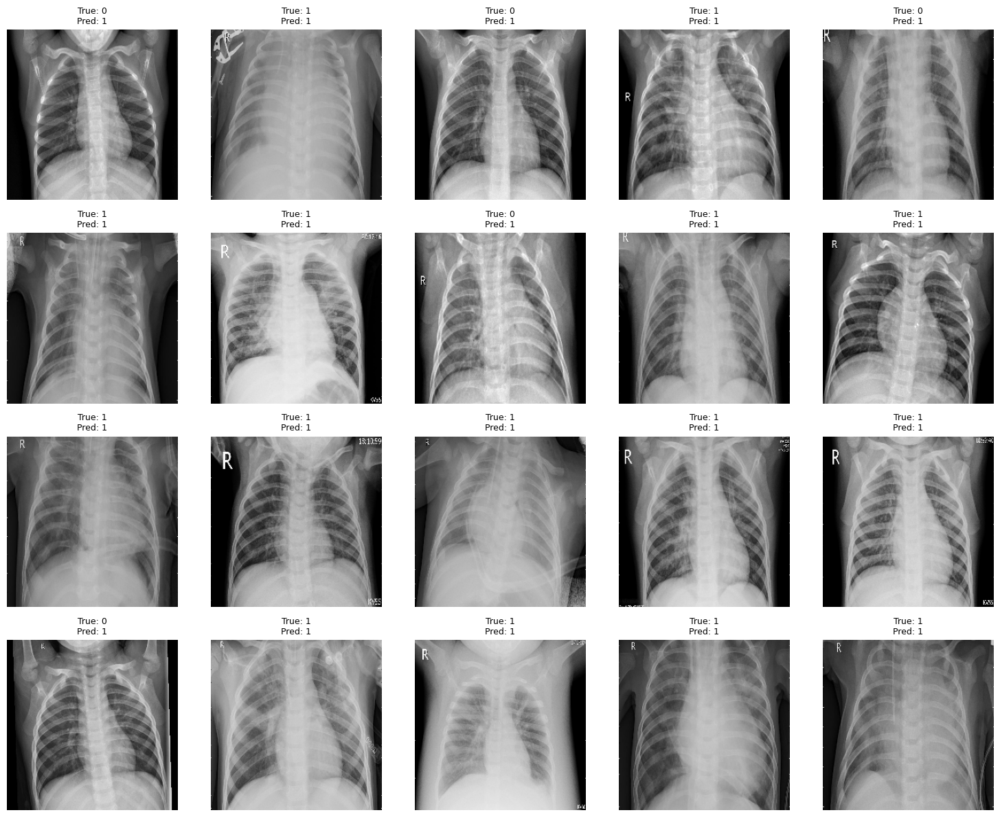

In [29]:
plot_predictions_on_images(
    model=clf_lr_fused,
    X_test_raw=X_test,
    y_test=y_test,
    class_labels=le.classes_,
    preprocess_fn=preprocess_fused_and_scale,
    num_images=20,
    num_cols=5
)

/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


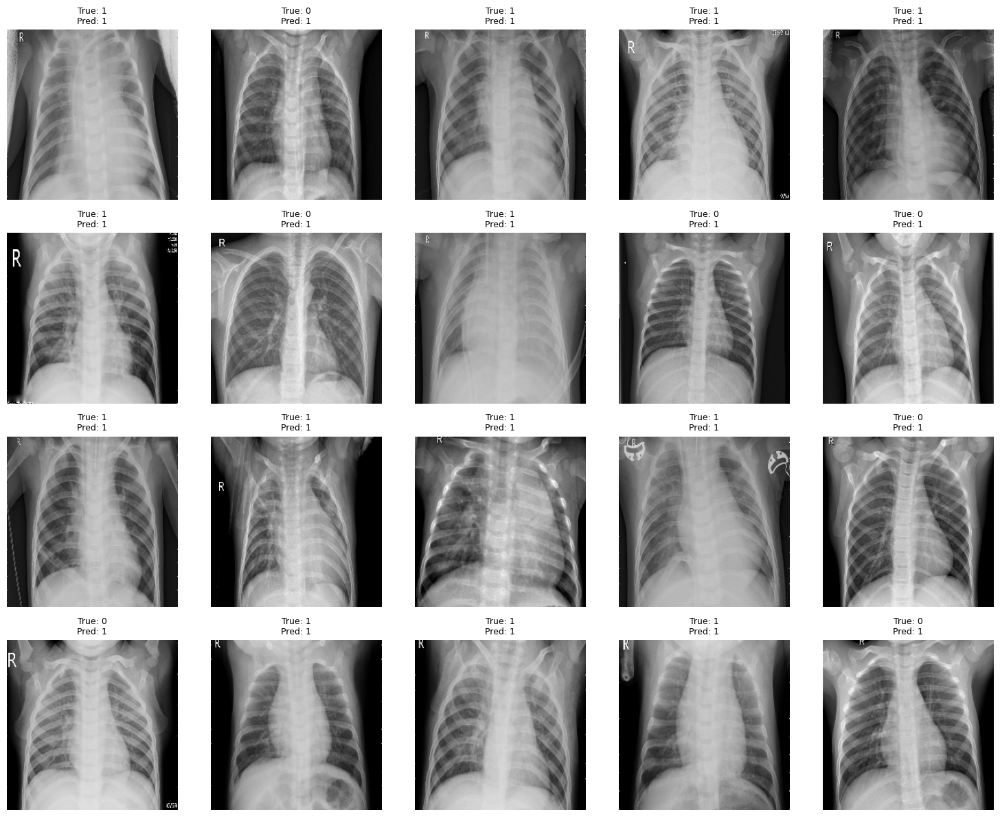

In [30]:
plot_predictions_on_images(
    model=clf_svm_fused,        
    X_test_raw=X_test,           
    y_test=y_test,              
    class_labels=le.classes_,  
    preprocess_fn=preprocess_fused_and_scale,
    num_images=20,
    num_cols=5
)

Đến phần feature fusion giữa **HOG + LBP**, tưởng chừng cho kết quả khả quan hơn. chưa như mong đợi 

| Mô hình                            | Macro F1 | Recall lớp 0 | Recall lớp 1 |
| ---------------------------------- | -------- | ------------ | ------------ |
| Logistic Regression (HOG + LBP)    | 0.65     | 0.31         | 0.99         |
| SVM (HOG + LBP, kernel = 'linear') | 0.64     | 0.30         | 0.99         |
| SVM (HOG + LBP, kernel = 'rbf')    | 0.62     | 0.27         | 0.99         |

> **Ghi chú**: Mặc dù đã **kết hợp HOG và LBP để tăng độ phong phú đặc trưng**, nhưng hiệu quả tổng thể **không được cải thiện so với dùng LBP đơn lẻ**. Điều này cho thấy việc **gộp đặc trưng không đồng nghĩa với hiệu suất tốt hơn**, nhất là khi hai kỹ thuật có thể **chồng chéo thông tin hoặc gây nhiễu** cho mô hình.


In [31]:
# # ========== LƯU MÔ HÌNH ==========
# import pickle
# import numpy as np
# from skimage.feature import hog, local_binary_pattern
# from skimage.color import rgb2gray

# # Lưu các thành phần cần thiết
# def save_model(scaler, label_encoder, model, model_name="best_model"):
#     """
#     Lưu scaler, label encoder và model vào file pkl
#     """
#     # Tạo dictionary chứa tất cả thành phần
#     model_package = {
#         'scaler': scaler,
#         'label_encoder': label_encoder,
#         'model': model,
#         'model_name': model_name
#     }
    
#     # Lưu vào file
#     filename = f"{model_name}_package.pkl"
#     with open(filename, 'wb') as f:
#         pickle.dump(model_package, f)
    
#     print(f"✅ Đã lưu mô hình vào file: {filename}")
#     return filename

# # Lưu mô hình tốt nhất (ví dụ: SVM)
# save_model(scaler, le, clf_svm, "svm_hog_lbp")
# # Hoặc lưu Logistic Regression
# save_model(scaler, le, clf_lr, "lr_hog_lbp")

In [32]:
# import os

# file_path = '/kaggle/working/svm_model.pkl'

# # Kiểm tra file có tồn tại rồi mới xoá cho an toàn nhen
# if os.path.exists(file_path):
#     os.remove(file_path)
#     print("File đã bay màu rồi đó ~ ✨")
# else:
#     print("File không tồn tại, chắc là đã xoá rồi á 🧐")


<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  Trích xuất đặc trưng từ CNN (ResNet, vgg, densenet, imagenet,...)
</h1>



In [33]:
# def extract_deep_features(X, target_size=(224, 224), model_name='resnet'): không batch size nên rất chậm
#     """
#     Trích xuất đặc trưng từ CNN pretrained (ResNet50 / VGG16 / DenseNet121).

#     Args:
#         X: list/array các ảnh RGB (hoặc grayscale).
#         target_size: kích thước resize (default: 224x224).
#         model_name: 'resnet', 'vgg', 'densenet'.

#     Return:
#         np.array shape (n_samples, feature_dim)
#     """
#     # 1. Load pretrained base_model + preprocess fn
#     if model_name == 'resnet':
#         base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
#         preprocess_fn = resnet_pre
#     elif model_name == 'vgg':
#         base_model = VGG16(weights='imagenet', include_top=False, pooling='avg')
#         preprocess_fn = vgg_pre
#     elif model_name == 'densenet':
#         base_model = DenseNet121(weights='imagenet', include_top=False, pooling='avg')
#         preprocess_fn = densenet_pre
#     else:
#         raise ValueError("Model không hỗ trợ 😊")
    
#     features = []
#     for img in X:
#         # Resize + ensure 3 kênh
#         img_resized = cv2.resize(img, target_size)
#         if img_resized.ndim == 2:
#             img_resized = cv2.cvtColor(img_resized, cv2.COLOR_GRAY2RGB)
#         elif img_resized.shape[2] == 1:
#             img_resized = np.repeat(img_resized, 3, axis=2)
#         else:
#             img_resized = img_resized[:, :, :3]
        
#         # Preprocess input và extract
#         arr = img_to_array(img_resized)
#         arr = np.expand_dims(arr, axis=0)
#         arr = preprocess_fn(arr)
#         feat = base_model.predict(arr, verbose=0)  # (1, feature_dim)
#         features.append(feat.flatten())
    
#     return np.array(features)


# # ----- Sau khi đã chia X_train, X_test, y_train, y_test ở trên -----

# # 1) Trích xuất deep-features cho từng backbone
# X_train_feat_resnet   = extract_deep_features(X_train, model_name='resnet')
# X_test_feat_resnet    = extract_deep_features(X_test,  model_name='resnet')

# X_train_feat_vgg      = extract_deep_features(X_train, model_name='vgg')
# X_test_feat_vgg       = extract_deep_features(X_test,  model_name='vgg')

# X_train_feat_densenet = extract_deep_features(X_train, model_name='densenet')
# X_test_feat_densenet  = extract_deep_features(X_test,  model_name='densenet')

# # 2) Chuẩn hóa feature từng backbone
# scaler_resnet   = StandardScaler()
# X_train_feat_resnet = scaler_resnet.fit_transform(X_train_feat_resnet)
# X_test_feat_resnet  = scaler_resnet.transform(X_test_feat_resnet)

# scaler_vgg      = StandardScaler()
# X_train_feat_vgg = scaler_vgg.fit_transform(X_train_feat_vgg)
# X_test_feat_vgg  = scaler_vgg.transform(X_test_feat_vgg)

# scaler_densenet = StandardScaler()
# X_train_feat_densenet = scaler_densenet.fit_transform(X_train_feat_densenet)
# X_test_feat_densenet  = scaler_densenet.transform(X_test_feat_densenet)

# # 3) Định nghĩa hàm preprocess deep+scale để dùng cho plot_predictions_on_images
# def preprocess_deep_resnet(X):
#     feats = extract_deep_features(X, model_name='resnet')
#     return scaler_resnet.transform(feats)

# def preprocess_deep_vgg(X):
#     feats = extract_deep_features(X, model_name='vgg')
#     return scaler_vgg.transform(feats)

# def preprocess_deep_densenet(X):
#     feats = extract_deep_features(X, model_name='densenet')
#     return scaler_densenet.transform(feats)

In [34]:
def extract_deep_features(X, target_size=(224, 224), model_name='resnet', batch_size=32): # batch size tăng tốc độ xử lý
    """
    Trích xuất đặc trưng từ CNN pretrained theo batch (dùng GPU hiệu quả hơn).
    """
    # 1. Load base model và preprocessing phù hợp
    if model_name == 'resnet':
        base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
        preprocess_fn = resnet_pre
    elif model_name == 'vgg':
        base_model = VGG16(weights='imagenet', include_top=False, pooling='avg')
        preprocess_fn = vgg_pre
    elif model_name == 'densenet':
        base_model = DenseNet121(weights='imagenet', include_top=False, pooling='avg')
        preprocess_fn = densenet_pre
    else:
        raise ValueError("Model không hỗ trợ 😊")

    # 2. Tiền xử lý tất cả ảnh trước
    processed_imgs = []
    for img in X:
        img_resized = cv2.resize(img, target_size)

        if img_resized.ndim == 2:
            img_resized = cv2.cvtColor(img_resized, cv2.COLOR_GRAY2RGB)
        elif img_resized.shape[2] == 1:
            img_resized = np.repeat(img_resized, 3, axis=2)
        else:
            img_resized = img_resized[:, :, :3]

        arr = img_to_array(img_resized)
        processed_imgs.append(arr)

    processed_imgs = np.array(processed_imgs)
    processed_imgs = preprocess_fn(processed_imgs)

    # 3. Predict theo batch
    features = base_model.predict(processed_imgs, batch_size=batch_size, verbose=1)
    return features

# ----- Sau khi đã chia X_train, X_test, y_train, y_test ở trên -----

# 1) Trích xuất deep-features cho từng backbone
X_train_feat_resnet   = extract_deep_features(X_train, model_name='resnet')
X_test_feat_resnet    = extract_deep_features(X_test,  model_name='resnet')

X_train_feat_vgg      = extract_deep_features(X_train, model_name='vgg')
X_test_feat_vgg       = extract_deep_features(X_test,  model_name='vgg')

X_train_feat_densenet = extract_deep_features(X_train, model_name='densenet')
X_test_feat_densenet  = extract_deep_features(X_test,  model_name='densenet')

# 2) Chuẩn hóa feature từng backbone
scaler_resnet   = StandardScaler()
X_train_feat_resnet = scaler_resnet.fit_transform(X_train_feat_resnet)
X_test_feat_resnet  = scaler_resnet.transform(X_test_feat_resnet)

scaler_vgg      = StandardScaler()
X_train_feat_vgg = scaler_vgg.fit_transform(X_train_feat_vgg)
X_test_feat_vgg  = scaler_vgg.transform(X_test_feat_vgg)

scaler_densenet = StandardScaler()
X_train_feat_densenet = scaler_densenet.fit_transform(X_train_feat_densenet)
X_test_feat_densenet  = scaler_densenet.transform(X_test_feat_densenet)

# 3) Định nghĩa hàm preprocess deep+scale để dùng cho plot_predictions_on_images
def preprocess_deep_resnet(X):
    feats = extract_deep_features(X, model_name='resnet')
    return scaler_resnet.transform(feats)

def preprocess_deep_vgg(X):
    feats = extract_deep_features(X, model_name='vgg')
    return scaler_vgg.transform(feats)

def preprocess_deep_densenet(X):
    feats = extract_deep_features(X, model_name='densenet')
    return scaler_densenet.transform(feats)

I0000 00:00:1748754998.155833      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


I0000 00:00:1748755017.688529     100 service.cc:148] XLA service 0x79a63014a280 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748755017.689616     100 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1748755018.302222     100 cuda_dnn.cc:529] Loaded cuDNN version 90300


  4/163 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

I0000 00:00:1748755021.473794     100 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


163/163 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 303ms/step
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
163/163 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
163/163 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 25s 790ms/step


In [35]:
models = {}  # Lưu model và preprocess_fn tương ứng (nếu cần)

# ----- ResNet50 features -----
# 1) Logistic Regression (ResNet)
clf_lr_resnet = LogisticRegression(max_iter=1000)
clf_lr_resnet.fit(X_train_feat_resnet, y_train_enc)

# Đánh giá trên test set
y_pred_lr_resnet = clf_lr_resnet.predict(X_test_feat_resnet)
print("\n🔹 RESNET + LOGISTIC REGRESSION")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_lr_resnet))
print(classification_report(y_test_enc, y_pred_lr_resnet, target_names=[str(c) for c in le.classes_]))

models[('resnet', 'logistic')] = clf_lr_resnet

# 2) SVM (ResNet)
clf_svm_resnet = SVC()
clf_svm_resnet.fit(X_train_feat_resnet, y_train_enc)

# Đánh giá trên test set
y_pred_svm_resnet = clf_svm_resnet.predict(X_test_feat_resnet)
print("\n🔹 RESNET + SVM")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_svm_resnet))
print(classification_report(y_test_enc, y_pred_svm_resnet, target_names=[str(c) for c in le.classes_]))

models[('resnet', 'svm')] = clf_svm_resnet


# ----- VGG16 features -----
# 3) Logistic Regression (VGG)
clf_lr_vgg = LogisticRegression(max_iter=1000)
clf_lr_vgg.fit(X_train_feat_vgg, y_train_enc)

# Đánh giá trên test set
y_pred_lr_vgg = clf_lr_vgg.predict(X_test_feat_vgg)
print("\n🔹 VGG + LOGISTIC REGRESSION")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_lr_vgg))
print(classification_report(y_test_enc, y_pred_lr_vgg, target_names=[str(c) for c in le.classes_]))

models[('vgg', 'logistic')] = clf_lr_vgg

# 4) SVM (VGG)
clf_svm_vgg = SVC()
clf_svm_vgg.fit(X_train_feat_vgg, y_train_enc)

# Đánh giá trên test set
y_pred_svm_vgg = clf_svm_vgg.predict(X_test_feat_vgg)
print("\n🔹 VGG + SVM")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_svm_vgg))
print(classification_report(y_test_enc, y_pred_svm_vgg, target_names=[str(c) for c in le.classes_]))

models[('vgg', 'svm')] = clf_svm_vgg


# ----- DenseNet121 features -----
# 5) Logistic Regression (DenseNet)
clf_lr_densenet = LogisticRegression(max_iter=1000)
clf_lr_densenet.fit(X_train_feat_densenet, y_train_enc)

# Đánh giá trên test set
y_pred_lr_densenet = clf_lr_densenet.predict(X_test_feat_densenet)
print("\n🔹 DENSENET + LOGISTIC REGRESSION")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_lr_densenet))
print(classification_report(y_test_enc, y_pred_lr_densenet, target_names=[str(c) for c in le.classes_]))

models[('densenet', 'logistic')] = clf_lr_densenet

# 6) SVM (DenseNet)
clf_svm_densenet = SVC()
clf_svm_densenet.fit(X_train_feat_densenet, y_train_enc)

# Đánh giá trên test set
y_pred_svm_densenet = clf_svm_densenet.predict(X_test_feat_densenet)
print("\n🔹 DENSENET + SVM")
print("Accuracy:", accuracy_score(y_test_enc, y_pred_svm_densenet))
print(classification_report(y_test_enc, y_pred_svm_densenet, target_names=[str(c) for c in le.classes_]))

models[('densenet', 'svm')] = clf_svm_densenet


🔹 RESNET + LOGISTIC REGRESSION
Accuracy: 0.7708333333333334
              precision    recall  f1-score   support

           0       0.98      0.40      0.57       234
           1       0.73      0.99      0.84       390

    accuracy                           0.77       624
   macro avg       0.86      0.70      0.70       624
weighted avg       0.83      0.77      0.74       624


🔹 RESNET + SVM
Accuracy: 0.7932692307692307
              precision    recall  f1-score   support

           0       0.96      0.47      0.63       234
           1       0.76      0.99      0.86       390

    accuracy                           0.79       624
   macro avg       0.86      0.73      0.74       624
weighted avg       0.83      0.79      0.77       624


🔹 VGG + LOGISTIC REGRESSION
Accuracy: 0.7868589743589743
              precision    recall  f1-score   support

           0       0.95      0.46      0.62       234
           1       0.75      0.98      0.85       390

    accuracy      


=== Visual: RESNET + LOGISTIC ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


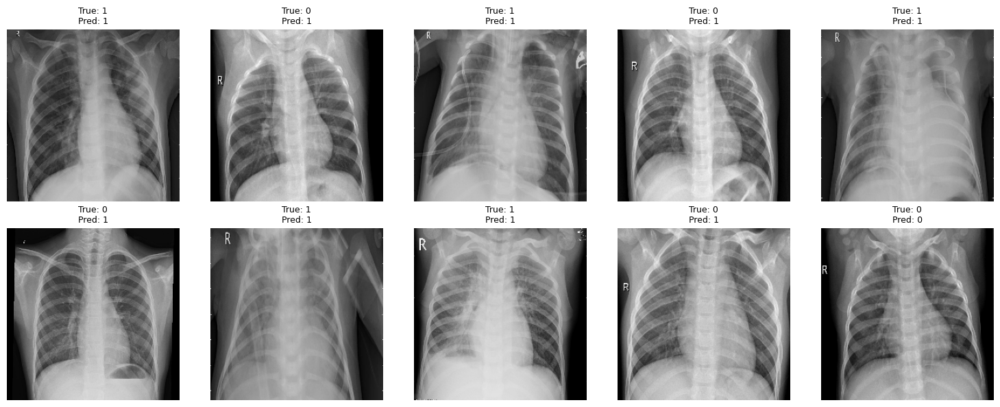


=== Visual: RESNET + SVM ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


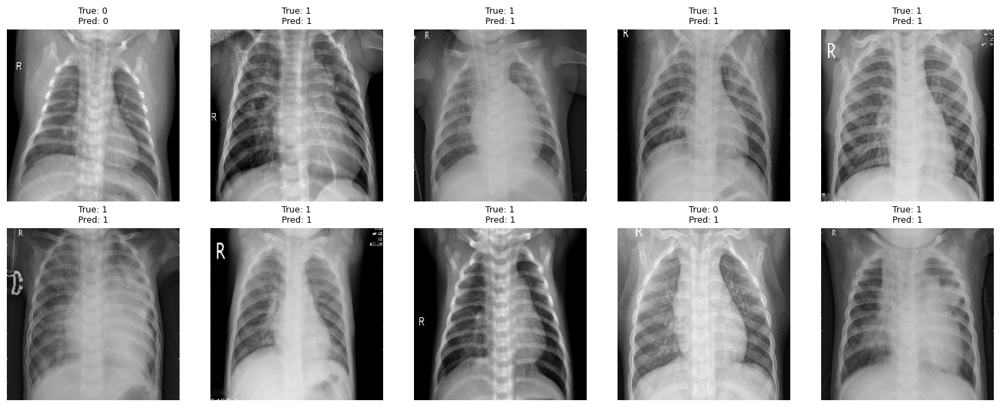


=== Visual: VGG + LOGISTIC ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


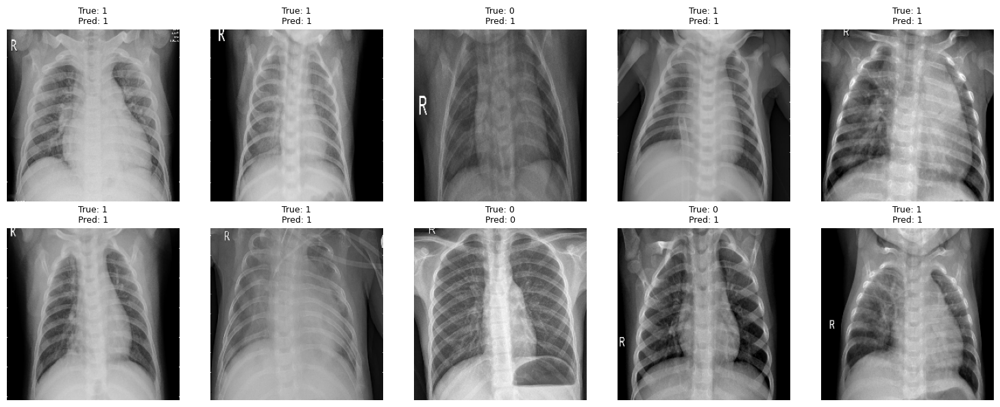


=== Visual: VGG + SVM ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


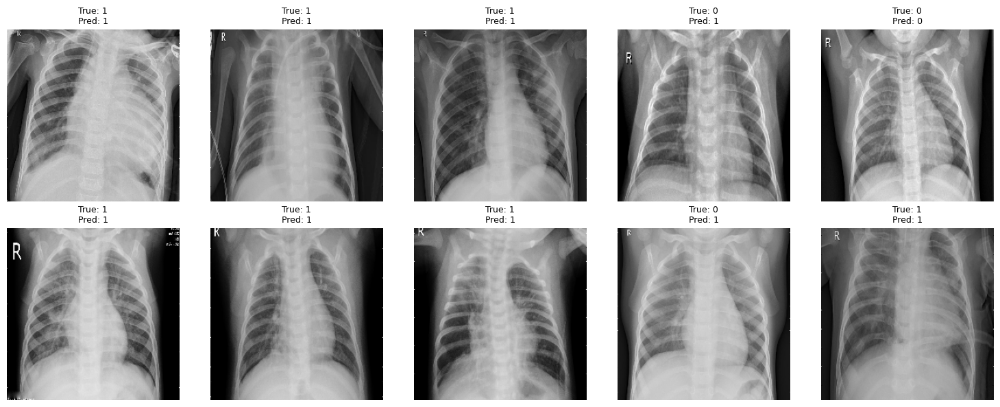


=== Visual: DENSENET + LOGISTIC ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


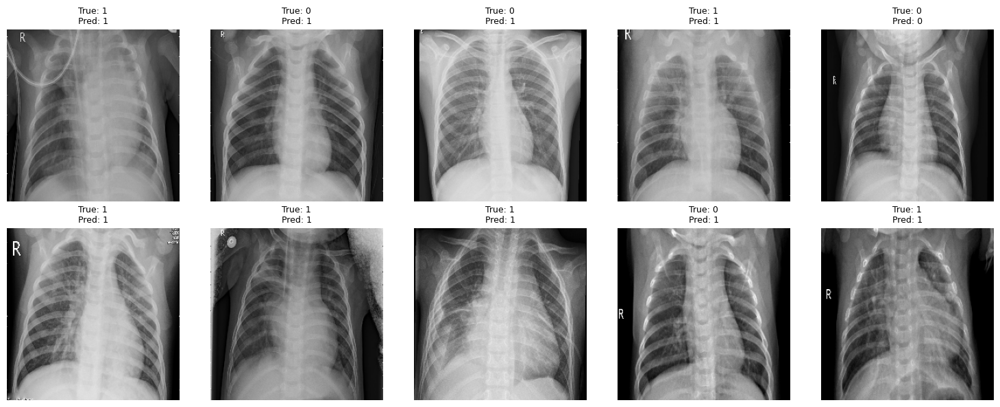


=== Visual: DENSENET + SVM ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


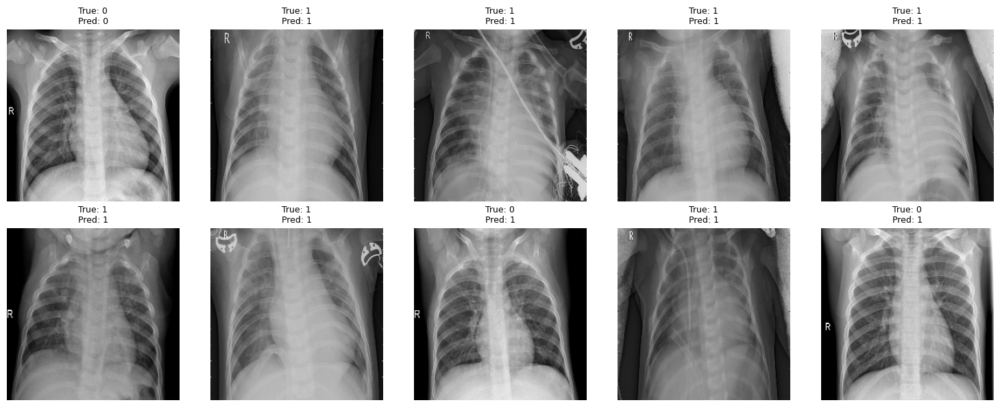

In [36]:
# Mỗi figure sẽ vẽ 10 ảnh (num_images=10), grid 2 hàng × 5 cột (num_cols=5)
# Lặp qua 6 model để gọi plot_predictions_on_images tương ứng

fig_configs = [
    ('resnet', 'logistic', preprocess_deep_resnet),
    ('resnet', 'svm',      preprocess_deep_resnet),
    ('vgg',    'logistic', preprocess_deep_vgg),
    ('vgg',    'svm',      preprocess_deep_vgg),
    ('densenet','logistic',preprocess_deep_densenet),
    ('densenet','svm',     preprocess_deep_densenet),
]

for backbone, clf_name, preprocess_fn in fig_configs:
    model = models[(backbone, clf_name)]
    title = f"{backbone.upper()} + {clf_name.upper()}"
    print(f"\n=== Visual: {title} ===")
    
    plot_predictions_on_images(
        model=model,
        X_test_raw=X_test,
        y_test=y_test,
        class_labels=le.classes_,
        preprocess_fn=preprocess_fn,
        num_images=10,
        num_cols=5
    )

| Tên Model               | F1 Macro | Recall lớp 0 | Recall lớp 1 |
| ----------------------- | -------- | ------------ | ------------ |
| ResNet + Logistic Reg.  | 0.70     | 0.40         | 0.99         |
| ResNet + SVM            | 0.74     | 0.47         | 0.99         |
| VGG + Logistic Reg.     | 0.73     | 0.46         | 0.98         |
| VGG + SVM               | 0.74     | 0.46         | 0.99         |
| DenseNet + Logistic Reg | 0.74     | 0.46         | 1.00         |
| DenseNet + SVM          | **0.77** | **0.51**     | **0.99**     |


Trong cuộc chiến "trí tuệ sắt thép" này, **DenseNet + SVM** đã **vượt mặt tất cả** khi đạt F1 macro cao nhất (**0.77**) cùng với khả năng cân bằng recall tốt hơn cho cả hai lớp — đặc biệt là **recall lớp 0 cao nhất (0.51)**, vốn là thách thức lớn nhất ở các mô hình còn lại. ✨

Nếu mục tiêu là **phân biệt tốt cả hai lớp**, nhất là không bỏ sót lớp 0, thì DenseNet + SVM chính là "ứng cử viên sáng giá để trao vương miện" 👑.


<blockquote style="margin-top: 36px; background: #f0f4f8; border-left: 6px solid #4a90e2; padding: 16px 20px; border-radius: 8px; font-size: 17px; font-style: italic; color: #2c3e50;">
  📝 “Qua các thực nghiệm trên, ta thấy việc tiền xử lý áp dụng các kỹ thuật trích xuất đặc trưng đem lại hiệu quả rõ rệt khi áp dụng lên các mô hình học máy truyền thống — không chỉ về <strong>độ chính xác</strong> mà còn về <strong>hiệu suất tài nguyên và thời gian xử lý</strong>.”
</blockquote>

<h1 style="font-size: 24px; font-weight: bold; color: #222; border-left: 8px solid #7eb6ff; padding-left: 14px; margin-top: 40px; background: linear-gradient(to right, #eaf4ff, #ffffff); border-radius: 8px; padding: 10px 14px; box-shadow: 0 2px 4px rgba(0,0,0,0.05);">
  Mở rộng - Dùng transfer learning với base model là Xception
</h1>



In [37]:
IMG_SIZE = 256

def load_dataset(split='train'):
    X = []
    y = []
    base_path = f"/kaggle/input/chest-xray-pneumonia/chest_xray/{split}/"
    classes = ['NORMAL', 'PNEUMONIA']
    
    for idx, c in enumerate(classes):
        files = glob.glob(os.path.join(base_path, c, "*.jpeg"))
        for f in files:
            img = cv2.imread(f)
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            X.append(img)
            y.append(idx)  # 0 for NORMAL, 1 for PNEUMONIA

    X = np.array(X)
    y = np.array(y)
    
    assert X.size > 0, 'Không đọc được file ảnh!'
    return X, y

In [38]:
X_train, y_train = load_dataset(split='train')
X_val, y_val = load_dataset(split='val')
X_test, y_test = load_dataset(split='test')

In [39]:
X_train.shape, X_val.shape, X_test.shape

((5216, 256, 256, 3), (16, 256, 256, 3), (624, 256, 256, 3))

In [40]:
# Normalizing Pixel Values 

# Normalize pixel values to [0, 1] range
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [41]:
X_train[0]

array([[[0.20392157, 0.20392157, 0.20392157],
        [0.00392157, 0.00392157, 0.00392157],
        [0.29803922, 0.29803922, 0.29803922],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.00784314, 0.00784314, 0.00784314],
        [0.00784314, 0.00784314, 0.00784314],
        [0.00392157, 0.00392157, 0.00392157],
        ...,
        [0.01176471, 0.01176471, 0.01176471],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.00392157, 0.00392157, 0.00392157],
        [0.00392157, 0.00392157, 0.00392157],
        [0.        , 0.        , 0.        ],
        ...,
        [0.05098039, 0.05098039, 0.05098039],
        [0.01568627, 0.01568627, 0.01568627],
        [0.        , 0.        , 0.        ]],

       ...,

       [[0.1372549 , 0.1372549 , 0.1372549 ],
        [0.14509804, 0.14509804, 0.14509804],
        [0.15294118, 0

In [42]:
# Build Xception Model
print("Đang xây dựng model...")

# Load the Xception base model without the top (classification) layer
base_model = Xception(weights='imagenet', include_top=False, pooling='avg', input_shape=(256, 256, 3))

# Freeze the layers in the base model
base_model.trainable = False

# Build Model 
model = Sequential()

# Base Model 
model.add(base_model)

# Batch Normalization
model.add(BatchNormalization())

# Dropout Layer
model.add(Dropout(0.45)) 

# Dense Layer 1
model.add(Dense(220, activation='relu'))

# Dropout Layer
model.add(Dropout(0.25)) 

# Dense Layer 2 
model.add(Dense(60, activation='relu'))

# Output Layer
model.add(Dense(1, activation='sigmoid'))

# Compile
model.compile(optimizer=Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

print("Model Summary:")
model.summary()

Đang xây dựng model...
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 2048)                │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 220)                 │         450,780 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 220)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 60)                  │          13,260 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              61 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,333,773 (81.38 MB)

 Trainable params: 468,197 (1.79 MB)

 Non-trainable params: 20,865,576 (79.60 MB)

In [43]:
# Callbacks

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=0.0001,
    verbose=1
)

# Training
print("Bắt đầu training...")
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

Bắt đầu training...
Epoch 1/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - accuracy: 0.8843 - loss: 0.2569 - val_accuracy: 0.8125 - val_loss: 0.4034 - learning_rate: 0.0010
Epoch 2/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.9502 - loss: 0.1357 - val_accuracy: 0.8750 - val_loss: 0.2488 - learning_rate: 0.0010
Epoch 3/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.9603 - loss: 0.1118 - val_accuracy: 0.7500 - val_loss: 0.4921 - learning_rate: 0.0010
Epoch 4/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.9589 - loss: 0.0993 - val_accuracy: 0.8750 - val_loss: 0.3466 - learning_rate: 0.0010
Epoch 5/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.9618 - loss: 0.0906 - val_accuracy: 0.9375 - val_loss: 0.2682 - learning_rate: 0.0010
Epoch 6/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.9688 - loss: 0.0829 - val_accuracy: 0.8750 - val_loss: 0.3191 - learning_rate: 0.0010
Epoch 7/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - 


ĐÁNH GIÁ MODEL TRÊN TEST SET
20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 230ms/step
Test Accuracy: 0.8462

Classification Report:
              precision    recall  f1-score   support

      NORMAL       0.92      0.65      0.76       234
   PNEUMONIA       0.82      0.97      0.89       390

    accuracy                           0.85       624
   macro avg       0.87      0.81      0.82       624
weighted avg       0.86      0.85      0.84       624


Confusion Matrix:
[[151  83]
 [ 13 377]]


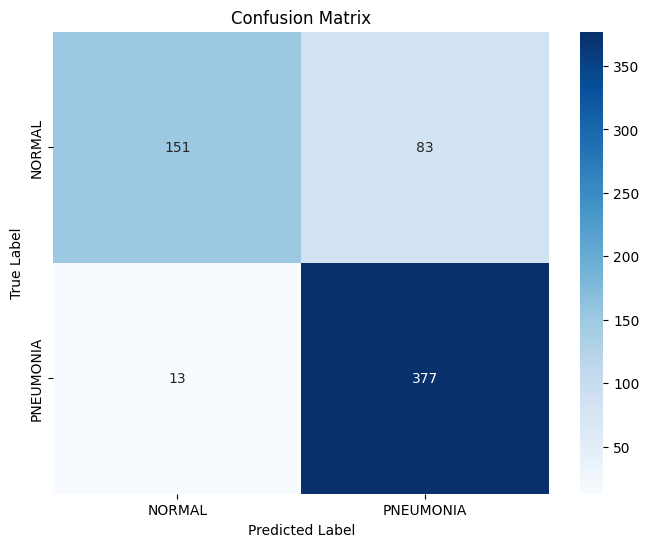

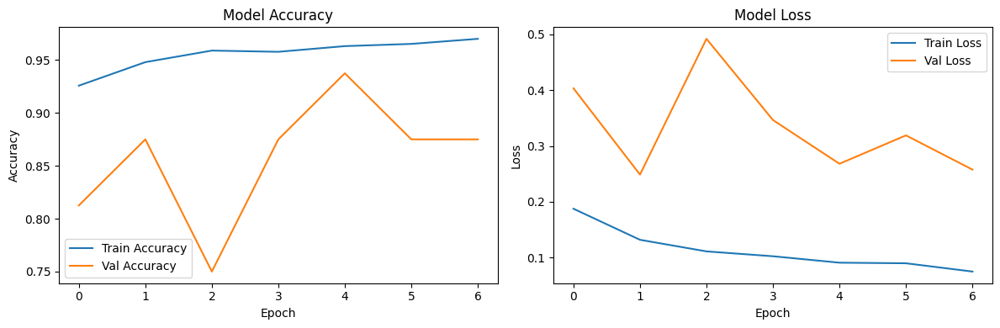

In [44]:
# Evaluation trên test set
print("\n" + "="*50)
print("ĐÁNH GIÁ MODEL TRÊN TEST SET")
print("="*50)

# Predict
y_pred_prob = model.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()

# Accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['NORMAL', 'PNEUMONIA']))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['NORMAL', 'PNEUMONIA'], 
            yticklabels=['NORMAL', 'PNEUMONIA'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


Đang load ảnh gốc để visualization...

Hiển thị kết quả dự đoán trên ảnh:


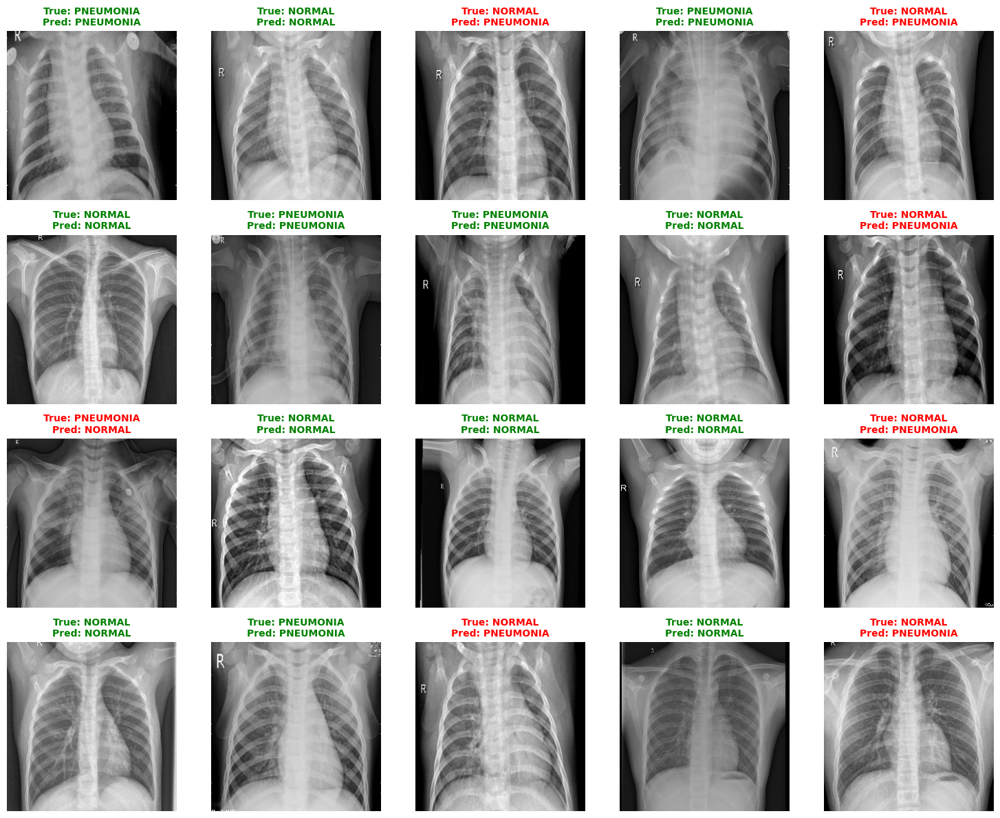

In [45]:
# Hàm visualize predictions - modified cho Keras model
def plot_predictions_on_images(model, X_test_raw, y_test, class_labels, 
                             preprocess_fn=None, num_images=20, num_cols=5, 
                             is_keras_model=True):
    """
    Hiển thị ảnh cùng với nhãn thật và nhãn dự đoán từ model.
    Args:
        model: mô hình đã huấn luyện (Keras hoặc sklearn).
        X_test_raw: array các ảnh gốc dạng RGB (N, H, W, 3).
        y_test: array nhãn thật.
        class_labels: list tên lớp, ví dụ ['NORMAL', 'PNEUMONIA'].
        preprocess_fn: hàm xử lý ảnh trước khi predict (resize, normalize,...).
        num_images: số lượng ảnh muốn hiển thị.
        num_cols: số ảnh mỗi dòng.
        is_keras_model: True nếu là Keras model, False nếu sklearn model.
    """
    # Chọn ngẫu nhiên num_images ảnh
    indices = np.random.choice(len(X_test_raw), size=num_images, replace=False)
    X_vis = X_test_raw[indices]
    y_true = y_test[indices]
    
    # Tiền xử lý nếu cần
    if preprocess_fn:
        X_processed = preprocess_fn(X_vis)
    else:
        X_processed = X_vis
    
    # Dự đoán
    if is_keras_model:
        y_pred_prob = model.predict(X_processed, verbose=0)
        y_pred = (y_pred_prob > 0.5).astype(int).flatten()
    else:
        y_pred = model.predict(X_processed)
    
    # Visualize
    plt.figure(figsize=(num_cols * 3, int(np.ceil(num_images / num_cols)) * 3))
    for i in range(num_images):
        plt.subplot(int(np.ceil(num_images / num_cols)), num_cols, i + 1)
        
        # Hiển thị ảnh (denormalize nếu cần)
        img_display = X_vis[i]
        if img_display.max() <= 1.0:  # Nếu đã normalize
            img_display = (img_display * 255).astype(np.uint8)
        else:
            img_display = img_display.astype(np.uint8)
            
        plt.imshow(img_display)
        
        # Tạo label
        true_label = class_labels[y_true[i]] if isinstance(y_true[i], (int, np.integer)) else y_true[i]
        pred_label = class_labels[y_pred[i]] if isinstance(y_pred[i], (int, np.integer)) else y_pred[i]
        
        # Đổi màu title nếu dự đoán sai
        color = 'green' if y_true[i] == y_pred[i] else 'red'
        plt.title(f'True: {true_label}\nPred: {pred_label}', 
                 fontsize=10, color=color, weight='bold')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Load ảnh gốc không resize để visualize
def load_original_images_for_viz(split='test', max_samples=None):
    """Load ảnh gốc với kích thước thật để visualization"""
    X_orig = []
    y_orig = []
    base_path = f"/kaggle/input/chest-xray-pneumonia/chest_xray/{split}/"
    classes = ['NORMAL', 'PNEUMONIA']
    
    for idx, c in enumerate(classes):
        files = glob.glob(os.path.join(base_path, c, "*.jpeg"))
        if max_samples:
            files = files[:max_samples//2]  # Lấy đều mỗi class
            
        for f in files:
            img = cv2.imread(f)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            img = cv2.resize(img, (256, 256))  # Resize nhẹ để hiển thị đẹp
            X_orig.append(img)
            y_orig.append(idx)
    
    return np.array(X_orig), np.array(y_orig)

# Preprocessing function cho visualization
def preprocess_for_prediction(X_raw):
    """Preprocess ảnh để predict với model"""
    X_processed = X_raw.astype(np.float32) / 255.0  # Normalize
    return X_processed

# Load ảnh gốc để visualize
print("\nĐang load ảnh gốc để visualization...")
X_test_orig, y_test_orig = load_original_images_for_viz(split='test', max_samples=100)

# Visualize predictions
print("\nHiển thị kết quả dự đoán trên ảnh:")
class_labels = ['NORMAL', 'PNEUMONIA']

plot_predictions_on_images(
    model=model,
    X_test_raw=X_test_orig,
    y_test=y_test_orig,
    class_labels=class_labels,
    preprocess_fn=preprocess_for_prediction,
    num_images=20,
    num_cols=5,
    is_keras_model=True
)

<h2 style="font-size: 20px; font-weight: bold; color: #333; border-left: 6px solid #a1c4fd; padding-left: 12px; margin-top: 32px; background: linear-gradient(to right, #f0faff, #ffffff); border-radius: 6px; padding: 8px 12px;">
    Bài 5 - Xây dựng ứng dụng phân tích ảnh chụp X-quang để dự đoán khả năng mắc viêm phổi
</h2>

<div style="border-radius: 12px; border: 2px solid #00AEEF; padding: 20px; background: linear-gradient(135deg, #e0f7fa, #f1f8e9); box-shadow: 0 4px 8px rgba(0,0,0,0.1); font-family: 'Segoe UI', sans-serif;">

<h2 style="color: #00796B; text-align: center; margin-top: 0;">
  Ứng dụng Phân tích X-Quang phát hiện Viêm Phổi
</h2>

<p style="font-size: 16px; color: #333;">
  Ứng dụng phân tích ảnh chụp X-quang và <strong>dự đoán khả năng mắc viêm phổi</strong> với nhiều mô hình để lựa chọn 
</p>

<p style="text-align: center; margin-top: 24px;">
  <a href="https://x-quang-detect-pneumonia.streamlit.app/" target="_blank" style="display: inline-block; background-color: #00AEEF; color: white; padding: 12px 24px; text-decoration: none; border-radius: 8px; font-weight: bold; box-shadow: 0 2px 6px rgba(0,0,0,0.2); transition: all 0.3s;">
    Trải nghiệm ngay tại đây
  </a>
</p>

</div>
